In [116]:
# Data Manuiplation dependencies
# https://numpy.org/
import numpy as np
# https://pandas.pydata.org/
import pandas as pd 
#----------------------------------
# Visualisations dependencies
# https://matplotlib.org/
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
#https://seaborn.pydata.org/
import seaborn as sns
#-------------------------------------
import warnings
import itertools
import os
#--------------------------------
sns.set(style="darkgrid")
# Modelling dependencies
#sklearn Dependencies
# All dependencies can be found here https://scikit-learn.org/stable/
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import KFold, StratifiedKFold
from sklearn.model_selection import train_test_split

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import precision_recall_fscore_support
from sklearn.metrics import roc_auc_score,confusion_matrix, classification_report

# Ignore warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', 90) # display all column of dataframe
pd.set_option('display.max_row', 100)
#-----------------------------------------------------------------------

# Table of Contents

    * EDA
 
    * For three Classes
        * Splitting and standardizing data for analysis

        * Logistic Model with Balanced Weights on Testing Data

        * Logistic Model with Balanced Weights on Validation Data

        * Logistic Model with no Balanced Weights on Testing Data

        * Logistic Model with no Balanced Weights on Validation Data

        * L-1 Regularization

        * Random Forest Model with Test Data

        * Random Forest Model with Validation Data
        
     * For Classes 0 and 1
        * Splitting and standardizing data for analysis

        * Logistic Model with Balanced Weights on Testing Data

        * Logistic Model with Balanced Weights on Validation Data

        * Logistic Model with no Balanced Weights on Testing Data

        * Logistic Model with no Balanced Weights on Validation Data
        
        * L-1 Regularization

        * Random Forest Model with Test Data

        * Random Forest Model with Validation Data

# Heading 

In [117]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=0)
    plt.yticks(tick_marks, classes)        


    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [118]:
def count_values_in_column(data,feature):
    total=data.loc[:,feature].value_counts(dropna=False)
    percentage=round(data.loc[:,feature].value_counts(dropna=False,normalize=True)*100,2)
    return pd.concat([total,percentage],axis=1,keys=['Total','Percentage'])

In [133]:
# import data and clean it
df = pd.read_csv('Contextual_Features.csv')
df.head()

,long,lat,Label,Point,lbpm_sc3_kurtosis,lbpm_sc3_max,lbpm_sc3_mean,lbpm_sc3_skew,lbpm_sc3_variance,lbpm_sc5_kurtosis,lbpm_sc5_max,lbpm_sc5_mean,lbpm_sc5_skew,lbpm_sc5_variance,lbpm_sc7_kurtosis,lbpm_sc7_max,lbpm_sc7_mean,lbpm_sc7_skew,lbpm_sc7_variance,lsr_sc31_line_contrast,lsr_sc31_line_length,lsr_sc31_line_mean,lsr_sc51_line_contrast,lsr_sc51_line_length,lsr_sc51_line_mean,lsr_sc71_line_contrast,lsr_sc71_line_length,lsr_sc71_line_mean,ndvi_sc3_mean,ndvi_sc3_variance,ndvi_sc5_mean,ndvi_sc5_variance,ndvi_sc7_mean,ndvi_sc7_variance,orb_sc31_kurtosis,orb_sc31_max,orb_sc31_mean,orb_sc31_skew,orb_sc31_variance,orb_sc51_kurtosis,orb_sc51_max,orb_sc51_mean,orb_sc51_skew,orb_sc51_variance,orb_sc71_kurtosis,...,gabor_sc3_filter_12,gabor_sc3_filter_13,gabor_sc3_filter_14,gabor_sc3_filter_2,gabor_sc3_filter_3,gabor_sc3_filter_4,gabor_sc3_filter_5,gabor_sc3_filter_6,gabor_sc3_filter_7,gabor_sc3_filter_8,gabor_sc3_filter_9,gabor_sc3_mean,gabor_sc3_variance,gabor_sc5_filter_1,gabor_sc5_filter_10,gabor_sc5_filter_11,gabor_sc5_filter_12,gabor_sc5_filter_13,gabor_sc5_filter_14,gabor_sc5_filter_2,gabor_sc5_filter_3,gabor_sc5_filter_4,gabor_sc5_filter_5,gabor_sc5_filter_6,gabor_sc5_filter_7,gabor_sc5_filter_8,gabor_sc5_filter_9,gabor_sc5_mean,gabor_sc5_variance,gabor_sc7_filter_1,gabor_sc7_filter_10,gabor_sc7_filter_11,gabor_sc7_filter_12,gabor_sc7_filter_13,gabor_sc7_filter_14,gabor_sc7_filter_2,gabor_sc7_filter_3,gabor_sc7_filter_4,gabor_sc7_filter_5,gabor_sc7_filter_6,gabor_sc7_filter_7,gabor_sc7_filter_8,gabor_sc7_filter_9,gabor_sc7_mean,gabor_sc7_variance
0,3.204167,6.911667,0,1,153.398791,5.02,0.498818,19.144339,1.217022,7.940662,11.16,1.220501,2.027661,5.317961,0.911802,18.85,2.372134,0.398236,14.405029,2.161797,2.151055,1.000134,3.079660,3.158707,1.037654,3.791711,3.895024,0.973391,0.312586,0.002839,0.206390,0.023505,0.154050,0.045298,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.054567,12.812452,1.000160,1.078044,13.206928,1.101271,13.213200,1.090952,13.171909,1.104067,13.064172,13.071736,1.031351,9.006027,27.319756,8.585666,25.676215,8.339256,24.671701,28.540172,9.085556,28.771785,9.135659,28.932851,9.055790,28.344580,8.896418,8.872528,27.892429,6.955875,61.095016,6.392970,54.379296,5.977051,49.821317,66.503494,6.985219,64.757161,7.080777,65.843166,7.078786,66.102310,6.811213,6.816379,65.199223
1,3.201667,6.910834,0,2,196.433558,6.29,0.441782,21.841225,1.271096,7.418572,16.20,1.214437,1.773921,7.223426,0.698769,31.08,2.371745,0.295401,23.835093,1.809051,1.831827,0.835521,2.932289,3.096902,1.015008,3.584475,3.758436,1.103619,0.498261,0.000574,0.328948,0.036528,0.243649,0.077184,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.301162,9.695759,0.309521,0.330559,9.694598,0.311350,9.707718,0.312207,9.739708,0.317548,9.699286,9.719076,0.335256,6.352775,13.760616,6.360666,13.766438,6.338096,13.717682,13.829015,6.332522,13.703470,6.360144,13.770915,6.377326,13.835602,6.362715,6.364544,13.912990,4.682027,28.706225,4.699450,28.828380,4.697201,28.915879,28.734477,4.648913,28.174815,4.690323,28.520097,4.666482,28.223428,4.696986,4.661414,28.588518
2,3.202500,6.910834,0,3,179.113675,5.87,0.439786,21.129914,1.179706,6.447273,14.53,1.212454,1.688199,6.503417,0.605517,28.07,2.371356,0.281807,22.210624,1.898158,1.905103,0.974359,2.979634,3.105585,1.048742,3.683048,3.828014,1.131314,0.319638,0.002933,0.209330,0.024486,0.154652,0.046360,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.397309,8.669246,0.383954,0.415342,8.683183,0.372648,8.736687,0.364507,8.748939,0.364702,8.762431,8.600819,0.406601,5.767524,12.092370,5.855174,12.078048,5.853087,12.048413,11.592570,5.822627,11.713184,5.901166,12.052198,5.922033,12.114768,5.912086,5.700343,11.428006,4.324014,26.713944,4.416996,26.350820,4.397066,26.102161,25.325623,4.414195,25.799741,4.507040,26.599272,4.520779,26.931343,4.487313,4.227843,24.898392
3,3.203333,6.910834,0,4,227.973282,4.78,0.450893,25.921663,0.936733,9.041996,11.68,1.210669,2.256273,4.715903,0.933094,22.78,2.370968,0.398171,15.653240,

In [134]:
#Count_values for sentiment
pie_data= count_values_in_column(df,"Label") # save data aS a dataframe
count_values_in_column(df,"Label")

,Total,Percentage
2,32089,67.47
0,15202,31.96
1,269,0.57


<function matplotlib.pyplot.show(close=None, block=None)>

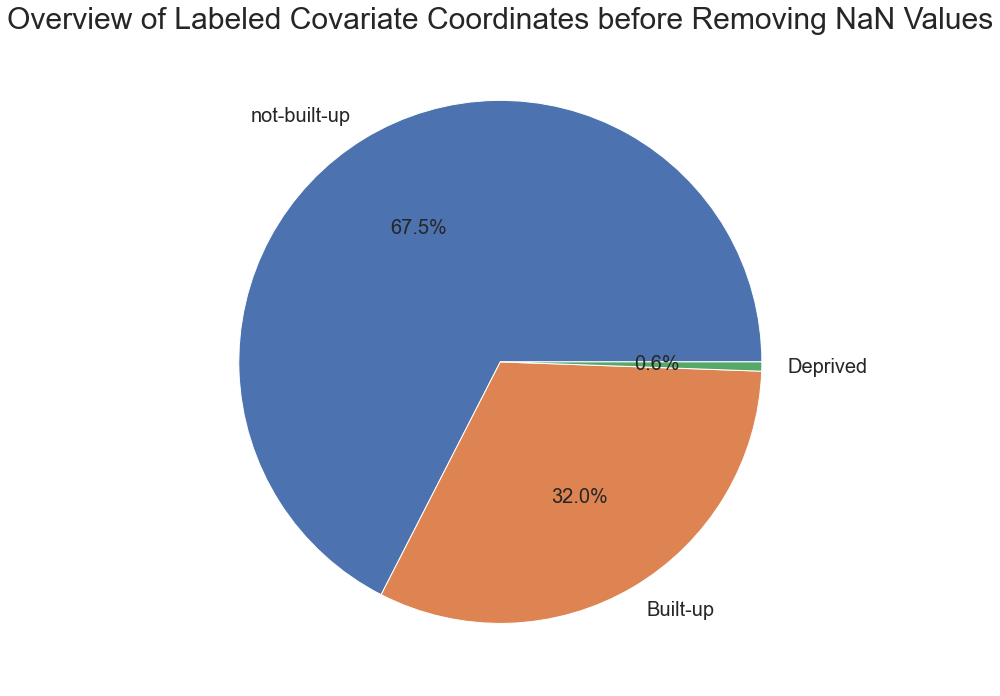

In [135]:
plt.figure(figsize=(10,10))
labels = ['not-built-up','Built-up', 'Deprived']
plt.title('Overview of Labeled Covariate Coordinates before Removing NaN Values', fontsize=30)
plt.pie(pie_data['Total'], labels=labels, autopct='%1.1f%%', textprops={'fontsize': 20})
plt.rcParams["axes.labelweight"] = "bold"
plt.tight_layout()
plt.show

In [7]:
# Some Useful Functions
def Distribution_plot(dataframe,feature, target, title, xlabel):
    """"
    Plot Distribution of feature for both classes
    
    Parameters
    ------------
    dataframe: Training dataframe
    feature: Variable to find distribution
    target: Dependent variable column containing all classes
    title: Plot title
    """
    
    # set the figure size
    plt.figure(figsize=(10,8))

    ax = plt.subplot()
    #distribution plot for all classes
    sns.distplot(dataframe[feature][dataframe[target] == 0], bins=50, label="Deprived Area")
    sns.distplot(dataframe[feature][dataframe[target] ==1], bins=50, label="Developed Area")
    sns.distplot(dataframe[feature][dataframe[target] ==2], bins=50, label="Water Area")

    plt.title(title, fontsize=14)
    plt.xlabel(xlabel)

    # Add legend and show plot
    ax.legend(title="Area classification")
    plt.show()

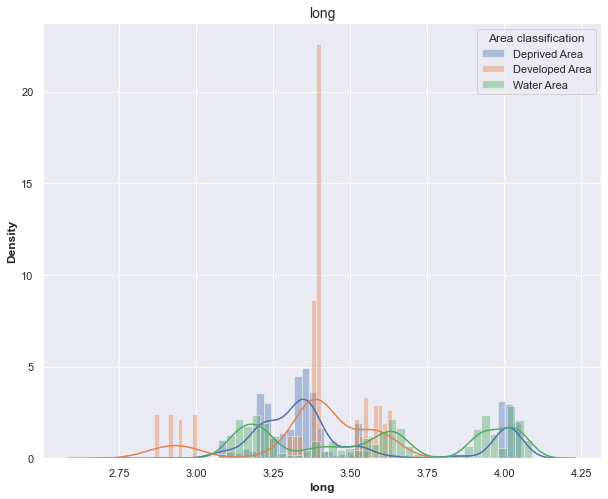

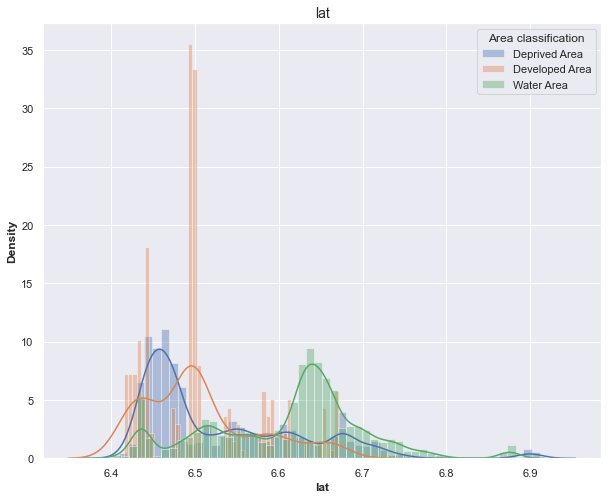

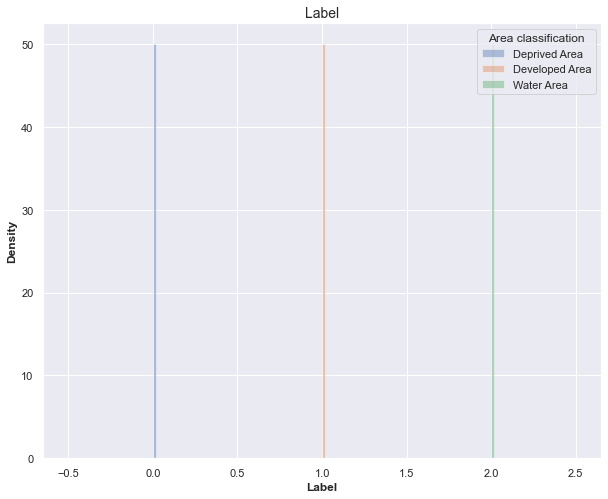

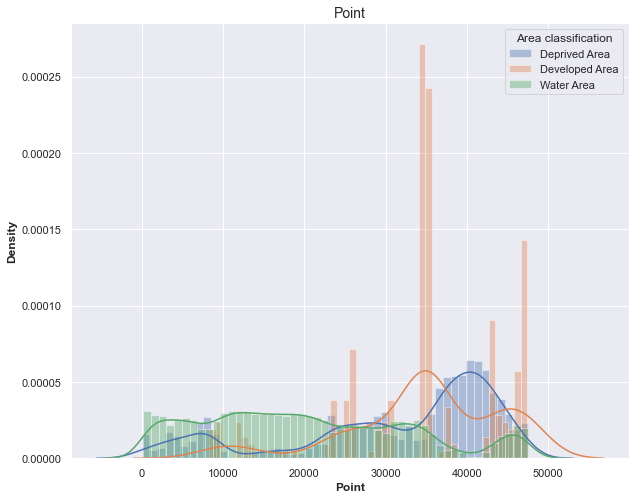

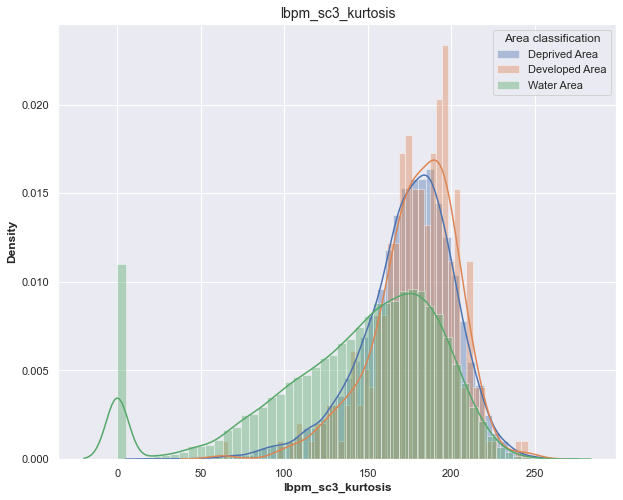

...

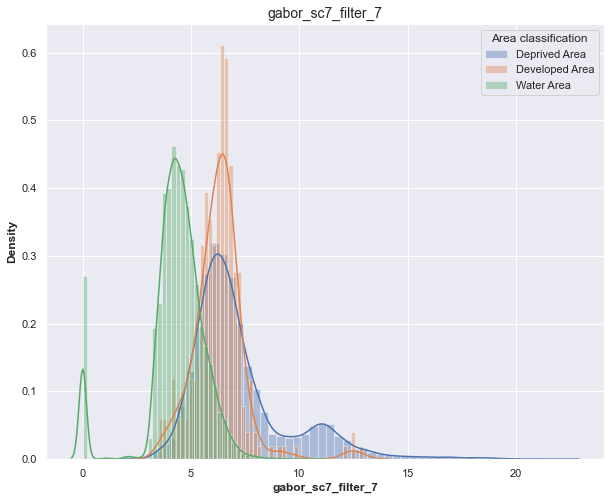

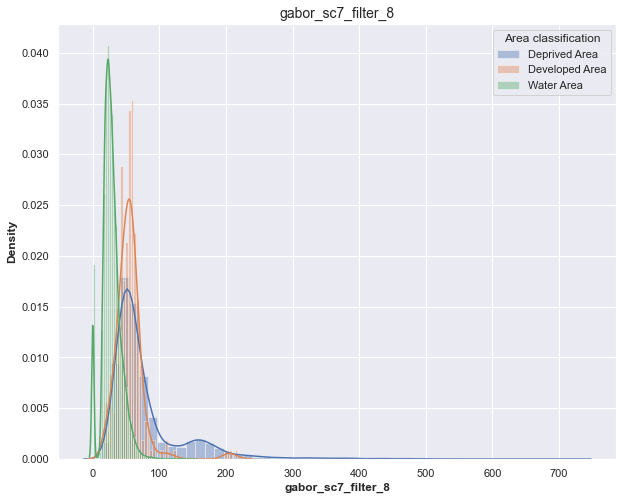

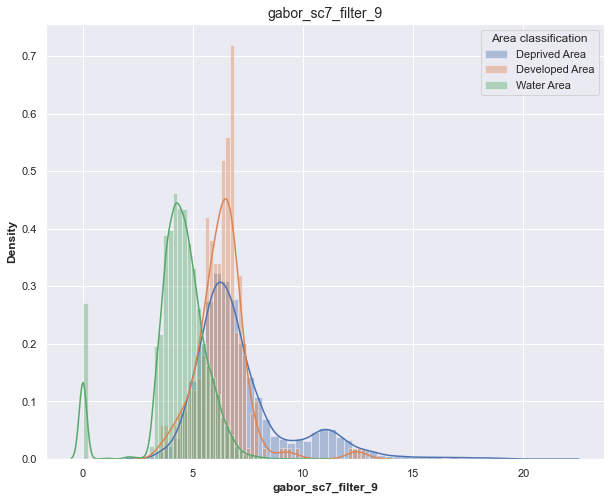

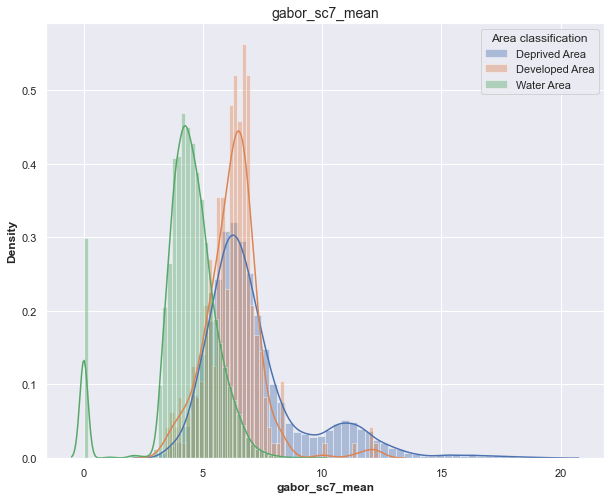

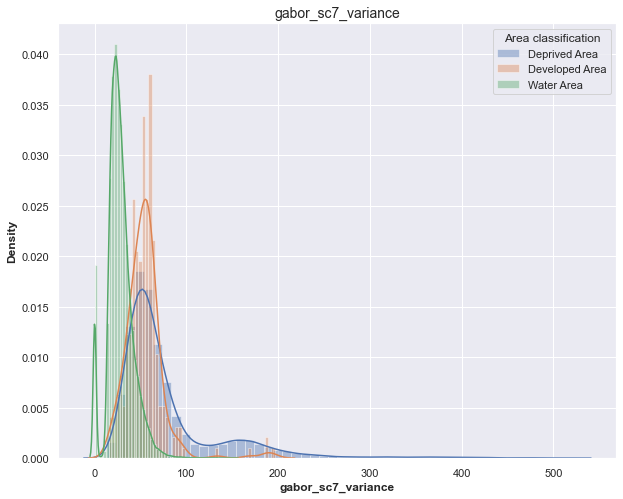

In [8]:
#created distribution plots for the variables
for i in df.columns:
    Distribution_plot(df, "{}".format(i), "Label", "{}".format(i), "{}".format(i))

In [136]:
#heat map on covariates
plt.figure(figsize=(150, 150))
plt.title('Correlation Heat Map of Covariate Data', fontsize= 250)
sns.heatmap(df.corr(), annot=True, vmin=-1, vmax=1, cmap='YlOrRd', square=True)
plt.tight_layout()
plt.show()

In [137]:
df.corr()



,long,lat,Label,Point,lbpm_sc3_kurtosis,lbpm_sc3_max,lbpm_sc3_mean,lbpm_sc3_skew,lbpm_sc3_variance,lbpm_sc5_kurtosis,lbpm_sc5_max,lbpm_sc5_mean,lbpm_sc5_skew,lbpm_sc5_variance,lbpm_sc7_kurtosis,lbpm_sc7_max,lbpm_sc7_mean,lbpm_sc7_skew,lbpm_sc7_variance,lsr_sc31_line_contrast,lsr_sc31_line_length,lsr_sc31_line_mean,lsr_sc51_line_contrast,lsr_sc51_line_length,lsr_sc51_line_mean,lsr_sc71_line_contrast,lsr_sc71_line_length,lsr_sc71_line_mean,ndvi_sc3_mean,ndvi_sc3_variance,ndvi_sc5_mean,ndvi_sc5_variance,ndvi_sc7_mean,ndvi_sc7_variance,orb_sc31_kurtosis,orb_sc31_max,orb_sc31_mean,orb_sc31_skew,orb_sc31_variance,orb_sc51_kurtosis,orb_sc51_max,orb_sc51_mean,orb_sc51_skew,orb_sc51_variance,orb_sc71_kurtosis,...,gabor_sc3_filter_12,gabor_sc3_filter_13,gabor_sc3_filter_14,gabor_sc3_filter_2,gabor_sc3_filter_3,gabor_sc3_filter_4,gabor_sc3_filter_5,gabor_sc3_filter_6,gabor_sc3_filter_7,gabor_sc3_filter_8,gabor_sc3_filter_9,gabor_sc3_mean,gabor_sc3_variance,gabor_sc5_filter_1,gabor_sc5_filter_10,gabor_sc5_filter_11,gabor_sc5_filter_12,gabor_sc5_filter_13,gabor_sc5_filter_14,gabor_sc5_filter_2,gabor_sc5_filter_3,gabor_sc5_filter_4,gabor_sc5_filter_5,gabor_sc5_filter_6,gabor_sc5_filter_7,gabor_sc5_filter_8,gabor_sc5_filter_9,gabor_sc5_mean,gabor_sc5_variance,gabor_sc7_filter_1,gabor_sc7_filter_10,gabor_sc7_filter_11,gabor_sc7_filter_12,gabor_sc7_filter_13,gabor_sc7_filter_14,gabor_sc7_filter_2,gabor_sc7_filter_3,gabor_sc7_filter_4,gabor_sc7_filter_5,gabor_sc7_filter_6,gabor_sc7_filter_7,gabor_sc7_filter_8,gabor_sc7_filter_9,gabor_sc7_mean,gabor_sc7_variance
long,1.000000,0.149836,0.171871,-0.176371,-0.216251,-0.202680,-0.244625,-0.226835,-0.099444,-0.167638,-0.182198,-0.247719,-0.183964,-0.063666,-0.152151,-0.184008,-0.249043,-0.165177,-0.058660,-0.157658,-0.153300,-0.253071,-0.213593,-0.213537,-0.282682,-0.232363,-0.233320,-0.303995,0.023776,-0.224077,0.023747,0.063101,0.023776,0.071146,-0.012936,-0.010777,-0.012028,-0.010721,-0.009669,-0.006808,-0.017103,-0.013621,-0.008081,-0.012697,-0.007933,...,0.012115,-0.082854,0.012600,0.012976,-0.081526,0.012511,-0.081700,0.011465,-0.081964,0.011174,-0.082269,-0.081512,0.013414,-0.079830,0.065748,-0.083198,0.065575,-0.084129,0.065306,0.068244,-0.080211,0.067615,-0.080653,0.066656,-0.081228,0.065920,-0.082062,-0.079730,0.068386,-0.077269,0.065988,-0.083685,0.065796,-0.085821,0.064789,0.070813,-0.078568,0.069401,-0.079128,0.067347,-0.079615,0.065993,-0.081313,-0.076568,0.071142
lat,0.149836,1.000000,0.378272,-0.978336,-0.235368,-0.224048,-0.299675,-0.257271,-0.106442,-0.200527,-0.200682,-0.293652,-0.224609,-0.061203,-0.187373,-0.199061,-0.293762,-0.209346,-0.053832,-0.004826,0.007960,0.049020,-0.059666,-0.050977,0.037223,-0.096409,-0.089854,0.028842,0.162823,-0.004929,0.163042,0.179566,0.163318,0.181209,-0.058372,-0.071707,-0.065945,-0.065354,-0.055591,-0.069365,-0.099285,-0.094330,-0.070377,-0.078453,-0.073448,...,-0.293246,-0.482701,-0.293949,-0.292641,-0.483305,-0.292715,-0.483118,-0.291481,-0.482944,-0.290667,-0.482821,-0.483526,-0.292830,-0.484390,-0.408720,-0.482541,-0.409281,-0.482105,-0.409215,-0.410634,-0.484116,-0.410567,-0.483389,-0.409541,-0.482732,-0.408541,-0.482608,-0.484382,-0.410340,-0.483929,-0.406330,-0.481219,-0.408574,-0.479433,-0.407414,-0.410393,-0.484227,-0.411563,-0.481894,-0.408330,-0.479680,-0.404640,-0.480524,-0.482960,-0.408367
Label,0.171871,0.378272,1.000000,-0.381272,-0.302913,-0.000131,-0.175409,-0.291976,0.152828,-0.351445,0.033324,-0.140048,-0.343722,0.203280,-0.372669,0.027482,-0.139744,-0.361219,0.210244,-0.190593,-0.183735,-0.301977,-0.208727,-0.204289,-0.331844,-0.208601,-0.204163,-0.340996,0.622293,0.014125,0.623202,0.631178,0.624330,0.635965,-0.098346,-0.121093,-0.113488,-0.108129,-0.094980,-0.106271,-0.163028,-0.156348,-0.108857,-0.129710,-0.116069,...,-0.462915,-0.605737,-0.463255,-0.463098,-0.607940,-0.463839,-0.607739,-0.462111,-0.607392,-0.461091,-0.606925,-0.607703,-0.462439,-0.610990,-0.556867,-0.606453,-0.555769,-0.604331,-0.554612,-0.559646,-0.611032,

# Splitting and standardizing data for analysis

In [138]:
# Split data to train, val, and test
X = df.drop(['Label','Point','long','lat'], axis=1)
y = df['Label']
# train, val, test split 60/20/20
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=42) # 0.25 x 0.8 = 0.2

#create X_train_PCA dataframe for feature selection in PCA
X_train_PCA = X_train.copy()

In [139]:
# Standardize Features for training and test set
# The StandardScaler
ss = StandardScaler()
# Standardize the training data
X_train = ss.fit_transform(X_train)
X_train_scaled = pd.DataFrame(X_train, columns= X.columns)
# Standardize Validation data
X_val = ss.fit_transform(X_val)
X_val_scaled = pd.DataFrame(X_val, columns= X.columns)
#Standardize Testing data
X_test = ss.fit_transform(X_test)
X_test_scaled = pd.DataFrame(X_test, columns= X.columns)

In [140]:
# Check shape of split data 
print('There are', X_train_scaled.shape[0], 'rows in the train data')
print('There are', X_val_scaled.shape[0], 'rows in the validation data')
print('There are', X_test_scaled.shape[0], 'rows in the test data')

There are 28536 rows in the train data
There are 9512 rows in the validation data
There are 9512 rows in the test data


# Logistic Model with Balanced Weights on Testing Data

In [141]:
# Fitting Logistice Regression model
models = {'lr': LogisticRegression(solver= "lbfgs",class_weight = "balanced", random_state=42)}

pipes = {}

for acronym, model in models.items():
    pipes[acronym] = Pipeline([('model', model)])
param_grids = {}

# Logistic Regression hyperparamters

# The parameter grid of tol
tol_grid = [10 ** -5, 10 ** -4, 10 ** -3, 10 ** -2, 10 ** -1]

# The parameter grid of C
C_grid = [0.001, 0.0001, 0.1, 1, 10]

#solver= ["newton-cg", "lbfgs"]

# Update param_grids
param_grids['lr'] = [{'model__tol': tol_grid,
                      'model__C': C_grid}]

In [142]:
# Make directory to save results 
directory = os.path.dirname('result/cv_results/GridSearchCV/')
if not os.path.exists(directory):
    os.makedirs(directory)

In [143]:
# Peform Grid Search on Logistic model
best_score_params_estimator_gs = []
# GridSearchCV
gs = GridSearchCV(estimator=pipes[acronym],
                      param_grid=param_grids[acronym],
                      scoring='f1_macro',
                      n_jobs=1,
                      cv=5,
                      return_train_score=True)
        
# Fit the pipeline
gs = gs.fit(X_train_scaled, y_train)
    

In [144]:
# Update best_score_params_estimator_gs
best_score_params_estimator_gs.append([gs.best_score_, gs.best_params_, gs.best_estimator_])
    
# Sort cv_results in ascending order of 'rank_test_score' and 'std_test_score'
cv_results = pd.DataFrame.from_dict(gs.cv_results_).sort_values(by=['rank_test_score', 'std_test_score'])
    
# Get the important columns in cv_results
important_columns = ['rank_test_score',
                         'mean_test_score', 
                         'std_test_score', 
                         'mean_train_score', 
                         'std_train_score',
                         'mean_fit_time', 
                         'std_fit_time',                        
                         'mean_score_time', 
                         'std_score_time']
    
# Move the important columns ahead
cv_results = cv_results[important_columns + sorted(list(set(cv_results.columns) - set(important_columns)))]

# Write cv_results file
cv_results.to_csv(path_or_buf='result/cv_results/GridSearchCV/' + acronym + '.csv', index=False)

# Sort best_score_params_estimator_gs in descending order of the best_score_
best_score_params_estimator_gs = sorted(best_score_params_estimator_gs, key=lambda x : x[0], reverse=True)

# Print best_score_params_estimator_gs
pd.DataFrame(best_score_params_estimator_gs, columns=['best_score', 'best_param', 'best_estimator'])

,best_score,best_param,best_estimator
0,0.579574,"{'model__C': 10, 'model__tol': 1e-05}","(LogisticRegression(C=10, class_weight='balanc..."


In [145]:
best_score_gs, best_params_gs, best_estimator_gs = best_score_params_estimator_gs[0]


In [146]:
# Predict using test data
y_test_pred = best_estimator_gs.predict(X_test_scaled)

# Get the precision, recall, fscore, support
precision, recall, fscore, support = precision_recall_fscore_support(y_test, y_test_pred)


# Get the dataframe of precision, recall, fscore and auc
pd.DataFrame([[precision, recall, fscore]], columns=['Precision', 'Recall', 'F1-score'])

,Precision,Recall,F1-score
0,"[0.8213614140654382, 0.04083570750237417, 0.94...","[0.7148936170212766, 0.86, 0.8578117683783362]","[0.7644382219110957, 0.07796917497733453, 0.90..."


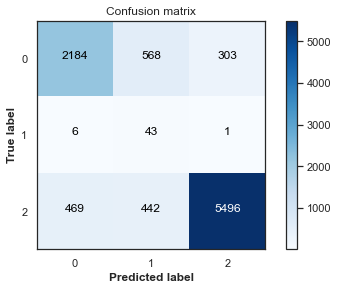

In [147]:
# Plotting confusion matrix obtained from the testing data predictions
sns.set(style="white")
cnf_matrix = confusion_matrix(y_test,y_test_pred)
np.set_printoptions(precision=2)


# Plot non-normalized confusion matrix
class_names = ["0","1","2"]
plt.figure()
plot_confusion_matrix(cnf_matrix
                      , classes=class_names
                      , title='Confusion matrix')
plt.show()

In [148]:
print(classification_report(y_test,y_test_pred))

              precision    recall  f1-score   support

           0       0.82      0.71      0.76      3055
           1       0.04      0.86      0.08        50
           2       0.95      0.86      0.90      6407

    accuracy                           0.81      9512
   macro avg       0.60      0.81      0.58      9512
weighted avg       0.90      0.81      0.85      9512



# Logistic Model with Balanced Weights on Validation Data

In [22]:
# Predict using test data
y_val_pred = best_estimator_gs.predict(X_val_scaled)

# Get the precision, recall, fscore, support
precision, recall, fscore, support = precision_recall_fscore_support(y_val, y_val_pred)


# Get the dataframe of precision, recall, fscore and auc
pd.DataFrame([[precision, recall, fscore]], columns=['Precision', 'Recall', 'F1-score'])

,Precision,Recall,F1-score
0,"[0.8412698412698413, 0.03140333660451423, 0.95...","[0.7281648675171737, 0.6530612244897959, 0.873...","[0.7806417674907942, 0.059925093632958795, 0.9..."


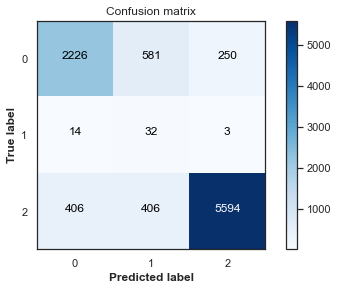

In [23]:
# Plotting confusion matrix obtained from the testing data predictions
sns.set(style="white")
cnf_matrix = confusion_matrix(y_val,y_val_pred)
np.set_printoptions(precision=2)


# Plot non-normalized confusion matrix
class_names = ["0","1","2"]
plt.figure()
plot_confusion_matrix(cnf_matrix
                      , classes=class_names
                      , title='Confusion matrix')
plt.show()

In [24]:
print(classification_report(y_val,y_val_pred))

              precision    recall  f1-score   support

           0       0.84      0.73      0.78      3057
           1       0.03      0.65      0.06        49
           2       0.96      0.87      0.91      6406

    accuracy                           0.83      9512
   macro avg       0.61      0.75      0.58      9512
weighted avg       0.91      0.83      0.87      9512



# Logistic Model Building with no Balanced Classes on Testing Data

In [25]:
# manually set weights
models = {'lr': LogisticRegression(solver= "lbfgs", random_state=42)}


pipes = {}

for acronym, model in models.items():
    pipes[acronym] = Pipeline([('model', model)])
param_grids = {}

# Logistic Regression hyperparamters

# The parameter grid of tol
tol_grid = [10 ** -5, 10 ** -4, 10 ** -3, 10 ** -2, 10 ** -1]

# The parameter grid of C
C_grid = [0.001, 0.0001, 0.1, 1, 10]

param_grids['lr'] = [{'model__tol': tol_grid,
                      'model__C': C_grid}]



In [26]:
# The list of [best_score_, best_params_, best_estimator_] obtained by GridSearchCV
best_score_params_estimator_gs = []
# GridSearchCV
gs = GridSearchCV(estimator=pipes[acronym],
                      param_grid=param_grids[acronym],
                      scoring='f1_macro',
                      n_jobs=-1,
                      cv=StratifiedKFold(),
                      return_train_score=True)
        
# Fit the pipeline
gs = gs.fit(X_train, y_train)
    
# Update best_score_params_estimator_gs
best_score_params_estimator_gs.append([gs.best_score_, gs.best_params_, gs.best_estimator_])
    
# Sort cv_results in ascending order of 'rank_test_score' and 'std_test_score'
cv_results = pd.DataFrame.from_dict(gs.cv_results_).sort_values(by=['rank_test_score', 'std_test_score'])
    
# Get the important columns in cv_results
important_columns = ['rank_test_score',
                         'mean_test_score', 
                         'std_test_score', 
                         'mean_train_score', 
                         'std_train_score',
                         'mean_fit_time', 
                         'std_fit_time',                        
                         'mean_score_time', 
                         'std_score_time']
    
# Move the important columns ahead
cv_results = cv_results[important_columns + sorted(list(set(cv_results.columns) - set(important_columns)))]

# Write cv_results file
cv_results.to_csv(path_or_buf='result/cv_results/GridSearchCV/' + acronym +  'stratifiedCV.csv', index=False)

# Sort best_score_params_estimator_gs in descending order of the best_score_
best_score_params_estimator_gs = sorted(best_score_params_estimator_gs, key=lambda x : x[0], reverse=True)

# Print best_score_params_estimator_gs
pd.DataFrame(best_score_params_estimator_gs, columns=['best_score', 'best_param', 'best_estimator'])

,best_score,best_param,best_estimator
0,0.593975,"{'model__C': 1, 'model__tol': 1e-05}","(LogisticRegression(C=1, random_state=42, tol=..."


In [27]:
best_score_gs, best_params_gs, best_estimator_gs = best_score_params_estimator_gs[0]
# Predict using test data
y_test_pred = best_estimator_gs.predict(X_test_scaled)

# Get the precision, recall, fscore, support
precision, recall, fscore, support = precision_recall_fscore_support(y_test, y_test_pred)


# Get the dataframe of precision, recall, fscore and auc
pd.DataFrame([[precision, recall, fscore]], columns=['Precision', 'Recall', 'F1-score'])

,Precision,Recall,F1-score
0,"[0.8640054127198917, 0.0, 0.9215985356924954]","[0.8360065466448445, 0.0, 0.9430310597783674]","[0.8497754117451339, 0.0, 0.9321916223096506]"


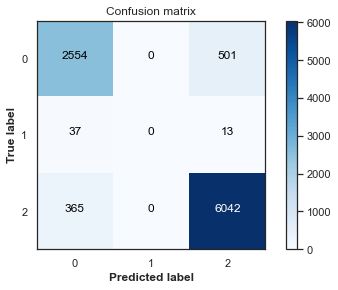

In [28]:
# Plotting confusion matrix obtained from the testing data predictions
sns.set(style="white")
cnf_matrix = confusion_matrix(y_test,y_test_pred)
np.set_printoptions(precision=2)


# Plot non-normalized confusion matrix
class_names = ["0","1","2"]
plt.figure()
plot_confusion_matrix(cnf_matrix
                      , classes=class_names
                      , title='Confusion matrix')
plt.show()

In [29]:
 print(classification_report(y_test,y_test_pred))
    
    

              precision    recall  f1-score   support

           0       0.86      0.84      0.85      3055
           1       0.00      0.00      0.00        50
           2       0.92      0.94      0.93      6407

    accuracy                           0.90      9512
   macro avg       0.60      0.59      0.59      9512
weighted avg       0.90      0.90      0.90      9512



# Logistic Model Building with no Balanced Classes on Validation Data

In [30]:
best_score_gs, best_params_gs, best_estimator_gs = best_score_params_estimator_gs[0]
# Predict using test data
y_val_pred = best_estimator_gs.predict(X_val_scaled)

# Get the precision, recall, fscore, support
precision, recall, fscore, support = precision_recall_fscore_support(y_val, y_val_pred)


# Get the dataframe of precision, recall, fscore and auc
pd.DataFrame([[precision, recall, fscore]], columns=['Precision', 'Recall', 'F1-score'])

,Precision,Recall,F1-score
0,"[0.8848797250859106, 0.0, 0.9251741896395032]","[0.8423290807981682, 0.0, 0.9534811114580081]","[0.8630802748449807, 0.0, 0.9391143911439115]"


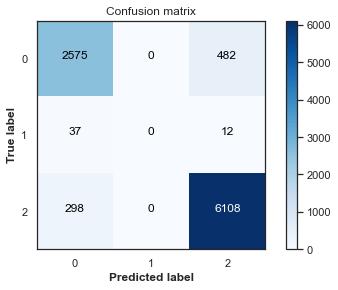

In [31]:
# Plotting confusion matrix obtained from the testing data predictions
sns.set(style="white")
cnf_matrix = confusion_matrix(y_val,y_val_pred)
np.set_printoptions(precision=2)


# Plot non-normalized confusion matrix
class_names = ["0","1","2"]
plt.figure()
plot_confusion_matrix(cnf_matrix
                      , classes=class_names
                      , title='Confusion matrix')
plt.show()

In [32]:
 print(classification_report(y_val,y_val_pred))
    
    

              precision    recall  f1-score   support

           0       0.88      0.84      0.86      3057
           1       0.00      0.00      0.00        49
           2       0.93      0.95      0.94      6406

    accuracy                           0.91      9512
   macro avg       0.60      0.60      0.60      9512
weighted avg       0.91      0.91      0.91      9512



# L1 Regularization

In [33]:
lm = LogisticRegression(penalty='l1',random_state=42, solver='liblinear')
# fit the model
lm.fit(X_train_scaled, y_train)
y_pred_lm= lm.predict(X_test_scaled)

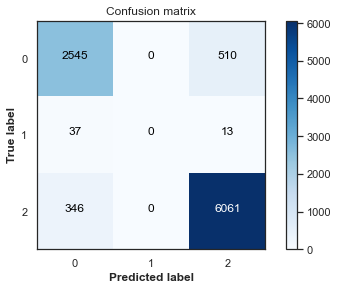

In [34]:
# Plotting confusion matrix obtained from the testing data predictions
sns.set(style="white")
cnf_matrix = confusion_matrix(y_test,y_pred_lm)
np.set_printoptions(precision=2)


# Plot non-normalized confusion matrix
class_names = ["0","1","2"]
plt.figure()
plot_confusion_matrix(cnf_matrix
                      , classes=class_names
                      , title='Confusion matrix')
plt.show()

In [35]:
 print(classification_report(y_test,y_pred_lm))
    
    

              precision    recall  f1-score   support

           0       0.87      0.83      0.85      3055
           1       0.00      0.00      0.00        50
           2       0.92      0.95      0.93      6407

    accuracy                           0.90      9512
   macro avg       0.60      0.59      0.59      9512
weighted avg       0.90      0.90      0.90      9512



In [36]:
#organize importance by coefficients
importance = lm.coef_[0]
Feat_num = []
Score = []
for i,v in enumerate(importance):
    Feat_num.append(i)
    Score.append(v)
feat_num = pd.DataFrame (Feat_num, columns = ['feature_number'])
score = pd.DataFrame (Score, columns = ['score'])


In [37]:
#get names of 
Names = []
for i in X:
    Names.append(i)
names = pd.DataFrame (Names, columns = ['Contextual_features'])
names.head()

,Contextual_features
0,lbpm_sc3_kurtosis
1,lbpm_sc3_max
2,lbpm_sc3_mean
3,lbpm_sc3_skew
4,lbpm_sc3_variance


In [38]:
metrics_1 = names.merge(feat_num, left_index=True, right_index=True)
metrics = metrics_1.merge(score, left_index=True, right_index=True)
metrics['values'] = metrics['score'].abs()
best_logistic= metrics.sort_values('values', ascending=False).reset_index(drop=True)
best_logistic.to_csv('Contextual_logistic_feature_importance.csv',index=False)
best_logistic.head()

,Contextual_features,feature_number,score,values
0,ndvi_sc7_variance,29,-10.237441,10.237441
1,ndvi_sc5_variance,27,10.167112,10.167112
2,ndvi_sc7_mean,28,-9.430494,9.430494
3,ndvi_sc3_mean,24,7.181088,7.181088
4,mean_sc3_mean,93,6.157483,6.157483


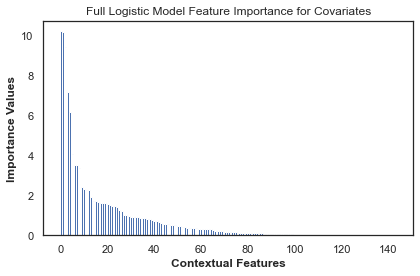

In [39]:
# plot feature importance
plt.figure()
plt.title('Full Logistic Model Feature Importance for Covariates')
plt.bar([x for x in range(len(importance))], best_logistic['values'])
plt.xlabel('Contextual Features')
plt.ylabel('Importance Values')
plt.tight_layout()
plt.show()

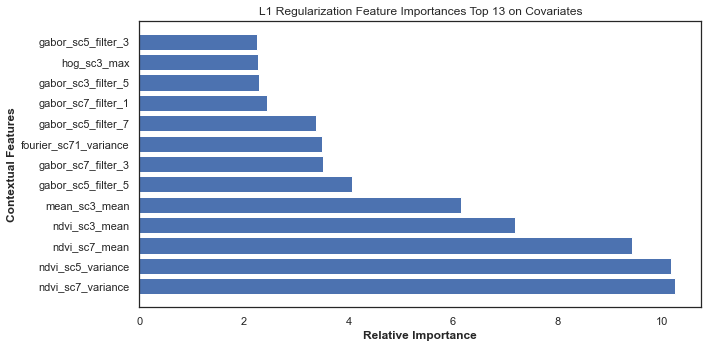

In [40]:
plt.figure(figsize=(10,5))
plt.title('L1 Regularization Feature Importances Top 13 on Covariates')
plt.barh(best_logistic['Contextual_features'][:13],best_logistic['values'][:13], color='b')
#plt.yticks(range(len(top_importances)), top_features)
plt.xlabel('Relative Importance')
plt.ylabel('Contextual Features')
plt.tight_layout()
plt.show()

# Random Forest Model with Test Data

In [41]:
models = {'rfc': RandomForestClassifier( random_state=42)}
pipes = {}

for acronym, model in models.items():
    pipes[acronym] = Pipeline([('model', model)])
param_grids = {}
# Random Forest Hyper Parameters
# The grids for min_samples_split
min_samples_split_grids = [2,10, 20, 50, 100]

# The grids for min_samples_leaf
min_samples_leaf_grids = [1,10, 20, 50, 100]

# Update param_grids
param_grids['rfc'] = [{'model__min_samples_split': min_samples_split_grids,
                       'model__min_samples_leaf': min_samples_leaf_grids}]

In [42]:
# The list of [best_score_, best_params_, best_estimator_] obtained by GridSearchCV
best_score_params_estimator_gs = []
# GridSearchCV
gs = GridSearchCV(estimator=pipes[acronym],
                      param_grid=param_grids[acronym],
                      scoring='f1_macro',
                      n_jobs=1,
                      cv=StratifiedKFold(),
                      return_train_score=True)
        
# Fit the pipeline
gs = gs.fit(X_train_scaled, y_train)
    
# Update best_score_params_estimator_gs
best_score_params_estimator_gs.append([gs.best_score_, gs.best_params_, gs.best_estimator_])
    
# Sort cv_results in ascending order of 'rank_test_score' and 'std_test_score'
cv_results = pd.DataFrame.from_dict(gs.cv_results_).sort_values(by=['rank_test_score', 'std_test_score'])
    
# Get the important columns in cv_results
important_columns = ['rank_test_score',
                         'mean_test_score', 
                         'std_test_score', 
                         'mean_train_score', 
                         'std_train_score',
                         'mean_fit_time', 
                         'std_fit_time',                        
                         'mean_score_time', 
                         'std_score_time']
    
# Move the important columns ahead
cv_results = cv_results[important_columns + sorted(list(set(cv_results.columns) - set(important_columns)))]

# Write cv_results file
cv_results.to_csv(path_or_buf='result/cv_results/GridSearchCV/' + acronym + '.csv', index=False)

# Sort best_score_params_estimator_gs in descending order of the best_score_
best_score_params_estimator_gs = sorted(best_score_params_estimator_gs, key=lambda x : x[0], reverse=True)

# Print best_score_params_estimator_gs
pd.DataFrame(best_score_params_estimator_gs, columns=['best_score', 'best_param', 'best_estimator'])

,best_score,best_param,best_estimator
0,0.623387,"{'model__min_samples_leaf': 1, 'model__min_sam...","((DecisionTreeClassifier(max_features='auto', ..."


In [43]:
best_score_gs, best_params_gs, best_estimator_gs = best_score_params_estimator_gs[0]


In [44]:
# Predict using test data
y_test_pred = best_estimator_gs.predict(X_test_scaled)

# Get the precision, recall, fscore, support
precision, recall, fscore, support = precision_recall_fscore_support(y_test, y_test_pred)


# Get the dataframe of precision, recall, fscore and auc
pd.DataFrame([[precision, recall, fscore]], columns=['Precision', 'Recall', 'F1-score'])

,Precision,Recall,F1-score
0,"[0.8956760466712422, 0.0, 0.9299787814489239]","[0.8543371522094927, 0.0, 0.9577025128765413]","[0.8745183447813704, 0.0, 0.9436370626682046]"


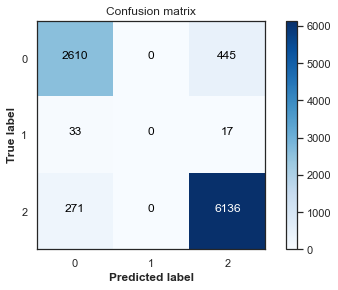

In [45]:
# Plotting confusion matrix obtained from the testing data predictions
sns.set(style="white")
cnf_matrix = confusion_matrix(y_test,y_test_pred)
np.set_printoptions(precision=2)


# Plot non-normalized confusion matrix
class_names = ["0","1","2"]
plt.figure()
plot_confusion_matrix(cnf_matrix
                      , classes=class_names
                      , title='Confusion matrix')
plt.show()

In [46]:
print(classification_report(y_test,y_test_pred))


              precision    recall  f1-score   support

           0       0.90      0.85      0.87      3055
           1       0.00      0.00      0.00        50
           2       0.93      0.96      0.94      6407

    accuracy                           0.92      9512
   macro avg       0.61      0.60      0.61      9512
weighted avg       0.91      0.92      0.92      9512



In [47]:
target="label"
# Get the best_score, best_param and best_estimator of random forest obtained by GridSearchCV
best_score_rfc, best_param_rfc, best_estimator_rfc = best_score_params_estimator_gs[0]

# Get the dataframe of feature and importance
df_fi_rfc = pd.DataFrame(np.hstack((np.setdiff1d(X.columns, [target]).reshape(-1, 1), best_estimator_rfc.named_steps['model'].feature_importances_.reshape(-1, 1))),
                         columns=['Features', 'Importance'])

# Sort df_fi_rfc in descending order of the importance
df_fi_rfc = df_fi_rfc.sort_values(ascending=False, by='Importance').reset_index(drop=True)

# Print the first 5 rows of df_fi_rfc
df_fi_rfc.head()

#save results as csv
df_fi_rfc.to_csv('Contextual_best_random_forest_features.csv',index=False)


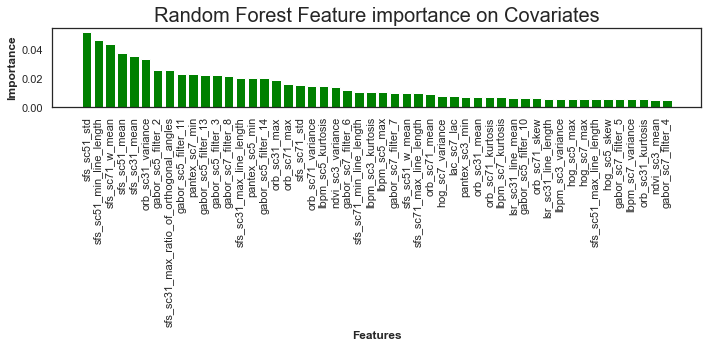

In [48]:
#Create a figure
fig = plt.figure(figsize=(10, 5))

# Implement me
# The bar plot of the top 5 feature importance
plt.bar(df_fi_rfc['Features'][:50], df_fi_rfc['Importance'][:50], color='green')

# Set x-axis
plt.title('Random Forest Feature importance on Covariates', fontsize=20)
plt.xlabel('Features')
plt.xticks(rotation=90)

# Set y-axis
plt.ylabel('Importance')

# Save and show the figure
plt.tight_layout()
plt.show()


# Random Forest Model with Validation Data

In [49]:
# Predict using test data
y_val_pred = best_estimator_gs.predict(X_val_scaled)

# Get the precision, recall, fscore, support
precision, recall, fscore, support = precision_recall_fscore_support(y_val, y_val_pred)


# Get the dataframe of precision, recall, fscore and auc
pd.DataFrame([[precision, recall, fscore]], columns=['Precision', 'Recall', 'F1-score'])

,Precision,Recall,F1-score
0,"[0.9097718760640109, 1.0, 0.9394492621329682]","[0.8740595354923127, 0.04081632653061224, 0.96...","[0.8915582248915582, 0.07843137254901959, 0.95..."


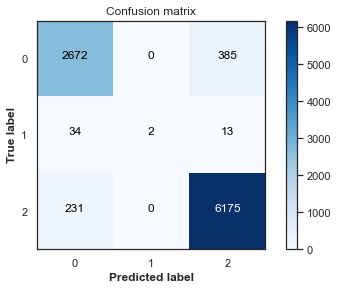

In [50]:
# Plotting confusion matrix obtained from the testing data predictions
sns.set(style="white")
cnf_matrix = confusion_matrix(y_val,y_val_pred)
np.set_printoptions(precision=2)


# Plot non-normalized confusion matrix
class_names = ["0","1","2"]
plt.figure()
plot_confusion_matrix(cnf_matrix
                      , classes=class_names
                      , title='Confusion matrix')
plt.show()

In [51]:
print(classification_report(y_val,y_val_pred))


              precision    recall  f1-score   support

           0       0.91      0.87      0.89      3057
           1       1.00      0.04      0.08        49
           2       0.94      0.96      0.95      6406

    accuracy                           0.93      9512
   macro avg       0.95      0.63      0.64      9512
weighted avg       0.93      0.93      0.93      9512



# PCA Feature Selection

In [149]:
from sklearn.decomposition import PCA
pca = PCA() # estimate only 2 PCs
X_new = pca.fit_transform(X_train_scaled)

In [150]:
# identify number of features needed to reach 95% threshold
total_explained_variance = pca.explained_variance_ratio_.cumsum()
n_over_95 = len(total_explained_variance[total_explained_variance >= .95])
n_to_reach_95 = abs(X_new.shape[1] - n_over_95 + 1)
print("Number features: {}\tTotal Variance Explained: {}".format(n_to_reach_95, total_explained_variance[n_to_reach_95-1]))

Number features: 21	Total Variance Explained: 0.9523494218226531


In [152]:
#show cumulative variance explained for first 21 components
pca.explained_variance_ratio_.cumsum()[0:21]

array([0.45, 0.62, 0.7 , 0.75, 0.78, 0.8 , 0.82, 0.84, 0.85, 0.87, 0.88,
       0.89, 0.9 , 0.91, 0.92, 0.92, 0.93, 0.94, 0.94, 0.95, 0.95])

In [153]:
#create pipe line for selecting features
pipe = Pipeline([('scaler', StandardScaler()),
 ('pca', PCA(n_components=60,random_state=42)),
 ('clf', RandomForestClassifier())])
pipe.fit(X_train,y_train)

Pipeline(steps=[('scaler', StandardScaler()),
                ('pca', PCA(n_components=60, random_state=42)),
                ('clf', RandomForestClassifier())])

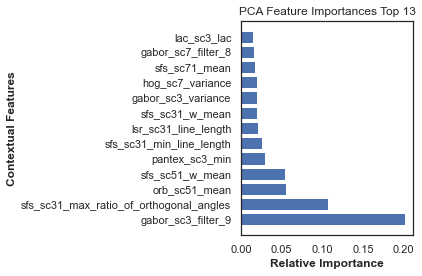

In [154]:
model = pipe.steps[1][1]
n_pcs= model.components_.shape[0]
initial_feature_names = X_train_PCA.columns
# loop through the absolute value of 144 pca components in model and select the largest value
most_important = [np.abs(model.components_[i]).argmax() for i in range(n_pcs)] 
# create list of most important features
most_important_names = [initial_feature_names[most_important[i]] for i in range(n_pcs)]
# run values through random forest to extract feature importance 
zipped_feats = zip(most_important_names, pipe.steps[2][1].feature_importances_)
#sort feature importance values
zipped_feats = sorted(zipped_feats, key=lambda x: x[1], reverse=True)
features, importances = zip(*zipped_feats)
top_features = features[:13]
top_importances = importances[:13]
plt.figure()
plt.title('PCA Feature Importances Top 13')
plt.barh(range(len(top_importances)), top_importances, color='b', align='center')
plt.yticks(range(len(top_importances)), top_features)
plt.xlabel('Relative Importance')
plt.ylabel('Contextual Features')
plt.tight_layout()
plt.show()

In [57]:
#Convert top features into a dataframe
top_pca_names = pd.DataFrame(features)
top_pca_values = pd.DataFrame(importances)
top_pca = top_pca_names.merge(top_pca_values, left_index=True,right_index=True)
top_pca= top_pca.rename(columns={'0_x':'names','0_y':'values'})
top_pca.to_csv('Contextual_best_pca_features.csv',index=False)
top_pca.head()

,names,values
0,gabor_sc3_filter_9,0.177408
1,sfs_sc31_max_ratio_of_orthogonal_angles,0.125632
2,orb_sc51_mean,0.068591
3,sfs_sc51_w_mean,0.056949
4,sfs_sc31_min_line_length,0.027303


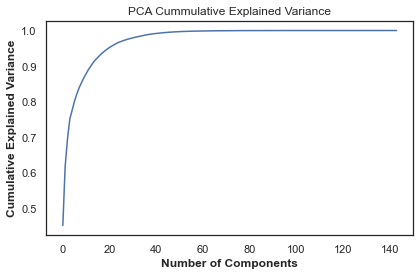

In [58]:
#plot cummulative explained variance
plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.title('PCA Cummulative Explained Variance')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.tight_layout()
plt.show()

# For Classes 0 and 1

# Splitting and standardizing data for analysis

In [59]:
# only select 0 and 1 classes
df = df[df['Label'].isin([0,1])]
X = df.drop(['Label','long','lat','Point'], axis=1)
y = df['Label']
# train, val, test split 60/20/20
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=42) # 0.25 x 0.8 = 0.2

In [60]:
# Shape of dataframe after removing class 2 
X.shape

(15471, 144)

In [61]:
# Standardize Features for training and test set
# The StandardScaler
ss = StandardScaler()
# Standardize the training data
X_train = ss.fit_transform(X_train)
X_train_scaled = pd.DataFrame(X_train, columns= X.columns)
# Standardize Validation data
X_val = ss.fit_transform(X_val)
X_val_scaled = pd.DataFrame(X_val, columns= X.columns)
#Standardize Testing data
X_test = ss.fit_transform(X_test)
X_test_scaled = pd.DataFrame(X_test, columns= X.columns)

In [62]:
# Check shape of split data 
print('There are', X_train_scaled.shape[0], 'rows in the train data')
print('There are', X_val_scaled.shape[0], 'rows in the validation data')
print('There are', X_test_scaled.shape[0], 'rows in the test data')

There are 9282 rows in the train data
There are 3094 rows in the validation data
There are 3095 rows in the test data


# Logistic Model with Balanced Weights on Testing Data

In [63]:
# Fitting Logistice Regression model
models = {'lr': LogisticRegression(solver= "lbfgs",class_weight = "balanced", random_state=42)}

pipes = {}

for acronym, model in models.items():
    pipes[acronym] = Pipeline([('model', model)])
param_grids = {}

# Logistic Regression hyperparamters

# The parameter grid of tol
tol_grid = [10 ** -5, 10 ** -4, 10 ** -3, 10 ** -2, 10 ** -1]

# The parameter grid of C
C_grid = [0.001, 0.0001, 0.1, 1, 10]

#solver= ["newton-cg", "lbfgs"]

# Update param_grids
param_grids['lr'] = [{'model__tol': tol_grid,
                      'model__C': C_grid}]

In [64]:
# Peform Grid Search on Logistic model
best_score_params_estimator_gs = []
# GridSearchCV
gs = GridSearchCV(estimator=pipes[acronym],
                      param_grid=param_grids[acronym],
                      scoring='f1_macro',
                      n_jobs=1,
                      cv=5,
                      return_train_score=True)
        
# Fit the pipeline
gs = gs.fit(X_train_scaled, y_train)

In [65]:
# Update best_score_params_estimator_gs
best_score_params_estimator_gs.append([gs.best_score_, gs.best_params_, gs.best_estimator_])
    
# Sort cv_results in ascending order of 'rank_test_score' and 'std_test_score'
cv_results = pd.DataFrame.from_dict(gs.cv_results_).sort_values(by=['rank_test_score', 'std_test_score'])
    
# Get the important columns in cv_results
important_columns = ['rank_test_score',
                         'mean_test_score', 
                         'std_test_score', 
                         'mean_train_score', 
                         'std_train_score',
                         'mean_fit_time', 
                         'std_fit_time',                        
                         'mean_score_time', 
                         'std_score_time']
    
# Move the important columns ahead
cv_results = cv_results[important_columns + sorted(list(set(cv_results.columns) - set(important_columns)))]

# Write cv_results file
cv_results.to_csv(path_or_buf='result/cv_results/GridSearchCV/' + acronym + '.csv', index=False)

# Sort best_score_params_estimator_gs in descending order of the best_score_
best_score_params_estimator_gs = sorted(best_score_params_estimator_gs, key=lambda x : x[0], reverse=True)

# Print best_score_params_estimator_gs
pd.DataFrame(best_score_params_estimator_gs, columns=['best_score', 'best_param', 'best_estimator'])

,best_score,best_param,best_estimator
0,0.491705,"{'model__C': 1, 'model__tol': 1e-05}","(LogisticRegression(C=1, class_weight='balance..."


In [66]:
best_score_gs, best_params_gs, best_estimator_gs = best_score_params_estimator_gs[0]

In [67]:
# Predict using test data
y_test_pred = best_estimator_gs.predict(X_test_scaled)

# Get the precision, recall, fscore, support
precision, recall, fscore, support = precision_recall_fscore_support(y_test, y_test_pred)


# Get the dataframe of precision, recall, fscore and auc
pd.DataFrame([[precision, recall, fscore]], columns=['Precision', 'Recall', 'F1-score'])

,Precision,Recall,F1-score
0,"[0.9957609156422212, 0.07201086956521739]","[0.774736147757256, 0.8412698412698413]","[0.8714524207011686, 0.13266583229036297]"


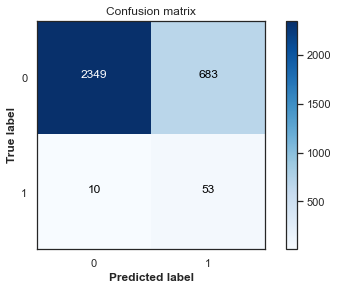

In [68]:
# Plotting confusion matrix obtained from the testing data predictions
sns.set(style="white")
cnf_matrix = confusion_matrix(y_test,y_test_pred)
np.set_printoptions(precision=2)


# Plot non-normalized confusion matrix
class_names = ["0","1"]
plt.figure()
plot_confusion_matrix(cnf_matrix
                      , classes=class_names
                      , title='Confusion matrix')
plt.show()

In [69]:
print(classification_report(y_test,y_test_pred))



              precision    recall  f1-score   support

           0       1.00      0.77      0.87      3032
           1       0.07      0.84      0.13        63

    accuracy                           0.78      3095
   macro avg       0.53      0.81      0.50      3095
weighted avg       0.98      0.78      0.86      3095



# Logistic Model with Balanced Weights on Validation Data

In [70]:
# Predict using test data
y_val_pred = best_estimator_gs.predict(X_val_scaled)

# Get the precision, recall, fscore, support
precision, recall, fscore, support = precision_recall_fscore_support(y_val, y_val_pred)


# Get the dataframe of precision, recall, fscore and auc
pd.DataFrame([[precision, recall, fscore]], columns=['Precision', 'Recall', 'F1-score'])

,Precision,Recall,F1-score
0,"[0.9929343308395677, 0.050872093023255814]","[0.7853385930309007, 0.6730769230769231]","[0.8770190895741556, 0.09459459459459459]"


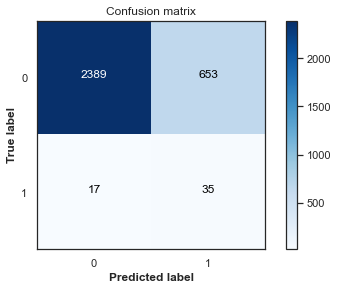

In [71]:
# Plotting confusion matrix obtained from the testing data predictions
sns.set(style="white")
cnf_matrix = confusion_matrix(y_val,y_val_pred)
np.set_printoptions(precision=2)


# Plot non-normalized confusion matrix
class_names = ["0","1"]
plt.figure()
plot_confusion_matrix(cnf_matrix
                      , classes=class_names
                      , title='Confusion matrix')
plt.show()

In [72]:
print(classification_report(y_val,y_val_pred))



              precision    recall  f1-score   support

           0       0.99      0.79      0.88      3042
           1       0.05      0.67      0.09        52

    accuracy                           0.78      3094
   macro avg       0.52      0.73      0.49      3094
weighted avg       0.98      0.78      0.86      3094



# Logistic Model Building with no Balanced Classes on Testing Data

In [73]:
# manually set weights
models = {'lr': LogisticRegression(solver= "lbfgs", random_state=42)}


pipes = {}

for acronym, model in models.items():
    pipes[acronym] = Pipeline([('model', model)])
param_grids = {}

# Logistic Regression hyperparamters

# The parameter grid of tol
tol_grid = [10 ** -5, 10 ** -4, 10 ** -3, 10 ** -2, 10 ** -1]

# The parameter grid of C
C_grid = [0.001, 0.0001, 0.1, 1, 10]

param_grids['lr'] = [{'model__tol': tol_grid,
                      'model__C': C_grid}]


In [74]:
# The list of [best_score_, best_params_, best_estimator_] obtained by GridSearchCV
best_score_params_estimator_gs = []
# GridSearchCV
gs = GridSearchCV(estimator=pipes[acronym],
                      param_grid=param_grids[acronym],
                      scoring='f1_macro',
                      n_jobs=-1,
                      cv=StratifiedKFold(),
                      return_train_score=True)
        
# Fit the pipeline
gs = gs.fit(X_train, y_train)
    
# Update best_score_params_estimator_gs
best_score_params_estimator_gs.append([gs.best_score_, gs.best_params_, gs.best_estimator_])
    
# Sort cv_results in ascending order of 'rank_test_score' and 'std_test_score'
cv_results = pd.DataFrame.from_dict(gs.cv_results_).sort_values(by=['rank_test_score', 'std_test_score'])
    
# Get the important columns in cv_results
important_columns = ['rank_test_score',
                         'mean_test_score', 
                         'std_test_score', 
                         'mean_train_score', 
                         'std_train_score',
                         'mean_fit_time', 
                         'std_fit_time',                        
                         'mean_score_time', 
                         'std_score_time']
    
# Move the important columns ahead
cv_results = cv_results[important_columns + sorted(list(set(cv_results.columns) - set(important_columns)))]

# Write cv_results file
cv_results.to_csv(path_or_buf='result/cv_results/GridSearchCV/' + acronym +  'stratifiedCV.csv', index=False)

# Sort best_score_params_estimator_gs in descending order of the best_score_
best_score_params_estimator_gs = sorted(best_score_params_estimator_gs, key=lambda x : x[0], reverse=True)

# Print best_score_params_estimator_gs
pd.DataFrame(best_score_params_estimator_gs, columns=['best_score', 'best_param', 'best_estimator'])

,best_score,best_param,best_estimator
0,0.513642,"{'model__C': 1, 'model__tol': 1e-05}","(LogisticRegression(C=1, random_state=42, tol=..."


In [75]:
best_score_gs, best_params_gs, best_estimator_gs = best_score_params_estimator_gs[0]
# Predict using test data
y_test_pred = best_estimator_gs.predict(X_test_scaled)

# Get the precision, recall, fscore, support
precision, recall, fscore, support = precision_recall_fscore_support(y_test, y_test_pred)


# Get the dataframe of precision, recall, fscore and auc
pd.DataFrame([[precision, recall, fscore]], columns=['Precision', 'Recall', 'F1-score'])

,Precision,Recall,F1-score
0,"[0.9796445880452342, 0.0]","[1.0, 0.0]","[0.9897176432185408, 0.0]"


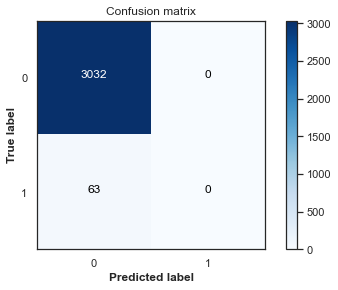

In [76]:
# Plotting confusion matrix obtained from the testing data predictions
sns.set(style="white")
cnf_matrix = confusion_matrix(y_test,y_test_pred)
np.set_printoptions(precision=2)


# Plot non-normalized confusion matrix
class_names = ["0","1"]
plt.figure()
plot_confusion_matrix(cnf_matrix
                      , classes=class_names
                      , title='Confusion matrix')
plt.show()

In [77]:
 print(classification_report(y_test,y_test_pred))
    
    

              precision    recall  f1-score   support

           0       0.98      1.00      0.99      3032
           1       0.00      0.00      0.00        63

    accuracy                           0.98      3095
   macro avg       0.49      0.50      0.49      3095
weighted avg       0.96      0.98      0.97      3095



# Logistic Model Building with no Balanced Classes on Validation Data

In [78]:
best_score_gs, best_params_gs, best_estimator_gs = best_score_params_estimator_gs[0]
# Predict using test data
y_val_pred = best_estimator_gs.predict(X_val_scaled)

# Get the precision, recall, fscore, support
precision, recall, fscore, support = precision_recall_fscore_support(y_val, y_val_pred)


# Get the dataframe of precision, recall, fscore and auc
pd.DataFrame([[precision, recall, fscore]], columns=['Precision', 'Recall', 'F1-score'])

,Precision,Recall,F1-score
0,"[0.9838292367399741, 1.0]","[1.0, 0.038461538461538464]","[0.9918487120965113, 0.07407407407407407]"


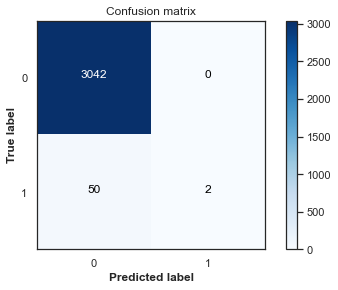

In [79]:
# Plotting confusion matrix obtained from the testing data predictions
sns.set(style="white")
cnf_matrix = confusion_matrix(y_val,y_val_pred)
np.set_printoptions(precision=2)


# Plot non-normalized confusion matrix
class_names = ["0","1"]
plt.figure()
plot_confusion_matrix(cnf_matrix
                      , classes=class_names
                      , title='Confusion matrix')
plt.show()

In [80]:
 print(classification_report(y_val,y_val_pred))
    

              precision    recall  f1-score   support

           0       0.98      1.00      0.99      3042
           1       1.00      0.04      0.07        52

    accuracy                           0.98      3094
   macro avg       0.99      0.52      0.53      3094
weighted avg       0.98      0.98      0.98      3094



# L1 Regularization

In [81]:
lm = LogisticRegression(penalty='l1',random_state=42, solver='liblinear')
# fit the model
lm.fit(X_train_scaled, y_train)
y_pred_lm= lm.predict(X_test_scaled)

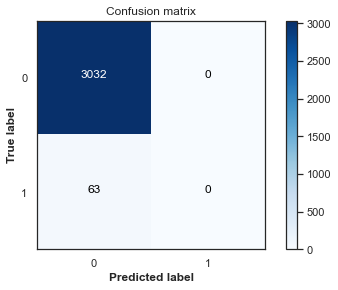

In [82]:
# Plotting confusion matrix obtained from the testing data predictions
sns.set(style="white")
cnf_matrix = confusion_matrix(y_test,y_pred_lm)
np.set_printoptions(precision=2)


# Plot non-normalized confusion matrix
class_names = ["0","1"]
plt.figure()
plot_confusion_matrix(cnf_matrix
                      , classes=class_names
                      , title='Confusion matrix')
plt.show()

In [83]:
 print(classification_report(y_test,y_pred_lm))
    
    

              precision    recall  f1-score   support

           0       0.98      1.00      0.99      3032
           1       0.00      0.00      0.00        63

    accuracy                           0.98      3095
   macro avg       0.49      0.50      0.49      3095
weighted avg       0.96      0.98      0.97      3095



In [84]:
#organize importance by coefficients
importance = lm.coef_[0]
Feat_num = []
Score = []
for i,v in enumerate(importance):
    Feat_num.append(i)
    Score.append(v)
feat_num = pd.DataFrame (Feat_num, columns = ['feature_number'])
score = pd.DataFrame (Score, columns = ['score'])


In [85]:
#get names of 
Names = []
for i in X:
    Names.append(i)
names = pd.DataFrame (Names, columns = ['Contextual_features'])
names.head()

,Contextual_features
0,lbpm_sc3_kurtosis
1,lbpm_sc3_max
2,lbpm_sc3_mean
3,lbpm_sc3_skew
4,lbpm_sc3_variance


In [86]:
metrics_1 = names.merge(feat_num, left_index=True, right_index=True)
metrics = metrics_1.merge(score, left_index=True, right_index=True)
metrics['values'] = metrics['score'].abs()
best_logistic_0_1= metrics.sort_values('values', ascending=False).reset_index(drop=True)
best_logistic_0_1.to_csv('Contextual_logistic_feature_importance_0_1.csv',index=False)
best_logistic_0_1.head()

,Contextual_features,feature_number,score,values
0,hog_sc7_variance,65,-1.187112,1.187112
1,orb_sc71_max,41,-1.180746,1.180746
2,fourier_sc31_mean,45,0.969352,0.969352
3,gabor_sc7_mean,142,-0.854680,0.854680
4,sfs_sc31_mean,80,-0.742657,0.742657


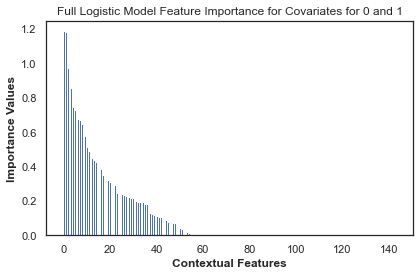

In [87]:
# plot feature importance
plt.figure()
plt.title('Full Logistic Model Feature Importance for Covariates for 0 and 1')
plt.bar([x for x in range(len(importance))], best_logistic_0_1['values'])
plt.xlabel('Contextual Features')
plt.ylabel('Importance Values')
plt.tight_layout()
plt.show()

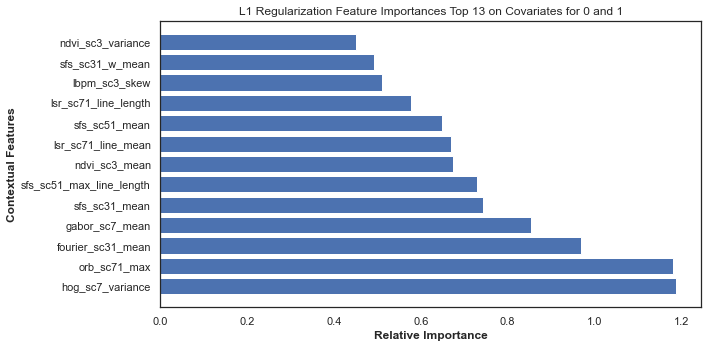

In [88]:
plt.figure(figsize=(10,5))
plt.title('L1 Regularization Feature Importances Top 13 on Covariates for 0 and 1')
plt.barh(best_logistic_0_1['Contextual_features'][:13],best_logistic_0_1['values'][:13], color='b')
#plt.yticks(range(len(top_importances)), top_features)
plt.xlabel('Relative Importance')
plt.ylabel('Contextual Features')
plt.tight_layout()
plt.show()

# Random Forest Model with Test Data

In [89]:
models = {'rfc': RandomForestClassifier( random_state=42)}
pipes = {}

for acronym, model in models.items():
    pipes[acronym] = Pipeline([('model', model)])
param_grids = {}
# Random Forest Hyper Parameters
# The grids for min_samples_split
min_samples_split_grids = [2,10, 20, 50, 100]

# The grids for min_samples_leaf
min_samples_leaf_grids = [1,10, 20, 50, 100]

# Update param_grids
param_grids['rfc'] = [{'model__min_samples_split': min_samples_split_grids,
                       'model__min_samples_leaf': min_samples_leaf_grids}]

In [90]:
# The list of [best_score_, best_params_, best_estimator_] obtained by GridSearchCV
best_score_params_estimator_gs = []
# GridSearchCV
gs = GridSearchCV(estimator=pipes[acronym],
                      param_grid=param_grids[acronym],
                      scoring='f1_macro',
                      n_jobs=1,
                      cv=StratifiedKFold(),
                      return_train_score=True)
        
# Fit the pipeline
gs = gs.fit(X_train_scaled, y_train)
    
# Update best_score_params_estimator_gs
best_score_params_estimator_gs.append([gs.best_score_, gs.best_params_, gs.best_estimator_])
    
# Sort cv_results in ascending order of 'rank_test_score' and 'std_test_score'
cv_results = pd.DataFrame.from_dict(gs.cv_results_).sort_values(by=['rank_test_score', 'std_test_score'])
    
# Get the important columns in cv_results
important_columns = ['rank_test_score',
                         'mean_test_score', 
                         'std_test_score', 
                         'mean_train_score', 
                         'std_train_score',
                         'mean_fit_time', 
                         'std_fit_time',                        
                         'mean_score_time', 
                         'std_score_time']
    
# Move the important columns ahead
cv_results = cv_results[important_columns + sorted(list(set(cv_results.columns) - set(important_columns)))]

# Write cv_results file
cv_results.to_csv(path_or_buf='result/cv_results/GridSearchCV/' + acronym + '.csv', index=False)

# Sort best_score_params_estimator_gs in descending order of the best_score_
best_score_params_estimator_gs = sorted(best_score_params_estimator_gs, key=lambda x : x[0], reverse=True)

# Print best_score_params_estimator_gs
pd.DataFrame(best_score_params_estimator_gs, columns=['best_score', 'best_param', 'best_estimator'])

,best_score,best_param,best_estimator
0,0.508573,"{'model__min_samples_leaf': 1, 'model__min_sam...","((DecisionTreeClassifier(max_features='auto', ..."


In [91]:
best_score_gs, best_params_gs, best_estimator_gs = best_score_params_estimator_gs[0]


In [92]:
# Predict using test data
y_test_pred = best_estimator_gs.predict(X_test_scaled)

# Get the precision, recall, fscore, support
precision, recall, fscore, support = precision_recall_fscore_support(y_test, y_test_pred)


# Get the dataframe of precision, recall, fscore and auc
pd.DataFrame([[precision, recall, fscore]], columns=['Precision', 'Recall', 'F1-score'])

,Precision,Recall,F1-score
0,"[0.9796445880452342, 0.0]","[1.0, 0.0]","[0.9897176432185408, 0.0]"


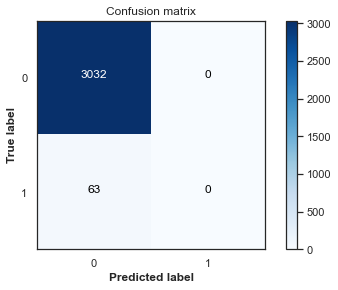

In [93]:
# Plotting confusion matrix obtained from the testing data predictions
sns.set(style="white")
cnf_matrix = confusion_matrix(y_test,y_test_pred)
np.set_printoptions(precision=2)


# Plot non-normalized confusion matrix
class_names = ["0","1"]
plt.figure()
plot_confusion_matrix(cnf_matrix
                      , classes=class_names
                      , title='Confusion matrix')
plt.show()

In [94]:
print(classification_report(y_test,y_test_pred))



              precision    recall  f1-score   support

           0       0.98      1.00      0.99      3032
           1       0.00      0.00      0.00        63

    accuracy                           0.98      3095
   macro avg       0.49      0.50      0.49      3095
weighted avg       0.96      0.98      0.97      3095



In [95]:
target="label"
# Get the best_score, best_param and best_estimator of random forest obtained by GridSearchCV
best_score_rfc, best_param_rfc, best_estimator_rfc = best_score_params_estimator_gs[0]

# Get the dataframe of feature and importance
df_fi_rfc_0_1 = pd.DataFrame(np.hstack((np.setdiff1d(X.columns, [target]).reshape(-1, 1), best_estimator_rfc.named_steps['model'].feature_importances_.reshape(-1, 1))),
                         columns=['Features', 'Importance'])

# Sort df_fi_rfc in descending order of the importance
df_fi_rfc_0_1 = df_fi_rfc_0_1.sort_values(ascending=False, by='Importance').reset_index(drop=True)

# Print the first 5 rows of df_fi_rfc
df_fi_rfc_0_1.head()

#save results as csv
df_fi_rfc_0_1.to_csv('Contextual_best_random_forest_features_0_1.csv',index=False)


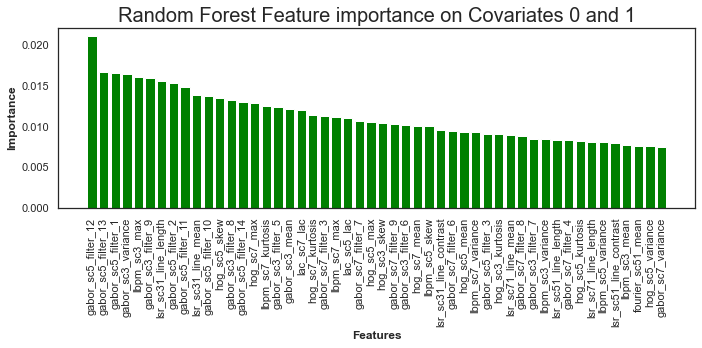

In [96]:
#Create a figure
fig = plt.figure(figsize=(10, 5))

# Implement me
# The bar plot of the top 5 feature importance
plt.bar(df_fi_rfc_0_1['Features'][:50], df_fi_rfc_0_1['Importance'][:50], color='green')

# Set x-axis
plt.title('Random Forest Feature importance on Covariates 0 and 1', fontsize=20)
plt.xlabel('Features')
plt.xticks(rotation=90)

# Set y-axis
plt.ylabel('Importance')

# Save and show the figure
plt.tight_layout()
plt.show()

# Random Forest Model with Validation Data

In [97]:
# Predict using test data
y_val_pred = best_estimator_gs.predict(X_val_scaled)

# Get the precision, recall, fscore, support
precision, recall, fscore, support = precision_recall_fscore_support(y_val, y_val_pred)


# Get the dataframe of precision, recall, fscore and auc
pd.DataFrame([[precision, recall, fscore]], columns=['Precision', 'Recall', 'F1-score'])

,Precision,Recall,F1-score
0,"[0.9838292367399741, 1.0]","[1.0, 0.038461538461538464]","[0.9918487120965113, 0.07407407407407407]"


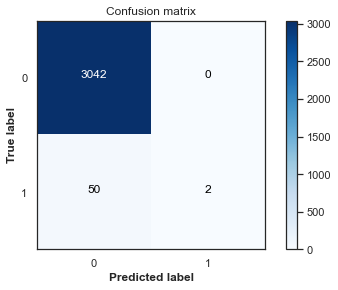

In [98]:
# Plotting confusion matrix obtained from the testing data predictions
sns.set(style="white")
cnf_matrix = confusion_matrix(y_val,y_val_pred)
np.set_printoptions(precision=2)


# Plot non-normalized confusion matrix
class_names = ["0","1"]
plt.figure()
plot_confusion_matrix(cnf_matrix
                      , classes=class_names
                      , title='Confusion matrix')
plt.show()

In [99]:
print(classification_report(y_val,y_val_pred))



              precision    recall  f1-score   support

           0       0.98      1.00      0.99      3042
           1       1.00      0.04      0.07        52

    accuracy                           0.98      3094
   macro avg       0.99      0.52      0.53      3094
weighted avg       0.98      0.98      0.98      3094



# PCA Feature Selection

In [100]:
from sklearn.decomposition import PCA
pca = PCA() # estimate only 2 PCs
X_new = pca.fit_transform(X_train_scaled)

In [101]:
total_explained_variance = pca.explained_variance_ratio_.cumsum()
n_over_95 = len(total_explained_variance[total_explained_variance >= .95])
n_to_reach_95 = abs(X_new.shape[1] - n_over_95 + 1)
print("Number features: {}\tTotal Variance Explained: {}".format(n_to_reach_95, total_explained_variance[n_to_reach_95-1]))

Number features: 30	Total Variance Explained: 0.9523162943706137


In [102]:
#create pipe line for selecting features
pipe = Pipeline([('scaler', StandardScaler()),
 ('pca', PCA(n_components=60,random_state=42)),
 ('clf', RandomForestClassifier())])
pipe.fit(X_train,y_train)

Pipeline(steps=[('scaler', StandardScaler()),
                ('pca', PCA(n_components=60, random_state=42)),
                ('clf', RandomForestClassifier())])

In [103]:
#show cumulative variance explained for first 30 components
pca.explained_variance_ratio_.cumsum()[0:30]

array([0.4 , 0.52, 0.6 , 0.64, 0.68, 0.71, 0.74, 0.76, 0.78, 0.8 , 0.82,
       0.83, 0.84, 0.86, 0.87, 0.88, 0.88, 0.89, 0.9 , 0.9 , 0.91, 0.92,
       0.92, 0.93, 0.93, 0.94, 0.94, 0.94, 0.95, 0.95])

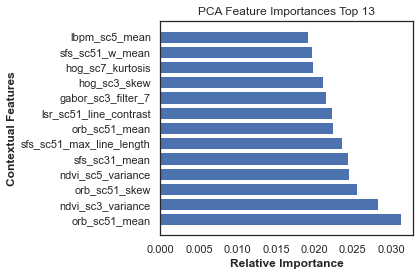

In [104]:
model = pipe.steps[1][1]
n_pcs= model.components_.shape[0]
initial_feature_names = X_train_PCA.columns
# loop through the absolute value of 144 pca components in model and select the largest value
most_important = [np.abs(model.components_[i]).argmax() for i in range(n_pcs)] 
# create list of most important features
most_important_names = [initial_feature_names[most_important[i]] for i in range(n_pcs)]
# run values through random forest to extract feature importance 
zipped_feats = zip(most_important_names, pipe.steps[2][1].feature_importances_)
#sort feature importance values
zipped_feats = sorted(zipped_feats, key=lambda x: x[1], reverse=True)
features, importances = zip(*zipped_feats)
top_features = features[:13]
top_importances = importances[:13]
plt.figure()
plt.title('PCA Feature Importances Top 13')
plt.barh(range(len(top_importances)), top_importances, color='b', align='center')
plt.yticks(range(len(top_importances)), top_features)
plt.xlabel('Relative Importance')
plt.ylabel('Contextual Features')
plt.tight_layout()
plt.show()

In [105]:
#Convert top features into a dataframe
top_pca_names = pd.DataFrame(features)
top_pca_values = pd.DataFrame(importances)
top_pca = top_pca_names.merge(top_pca_values, left_index=True,right_index=True)
top_pca= top_pca.rename(columns={'0_x':'names','0_y':'values'})
top_pca.to_csv('Contextual_best_pca_features_0_1.csv',index=False)
top_pca.head()

,names,values
0,orb_sc51_mean,0.031302
1,ndvi_sc3_variance,0.028247
2,orb_sc51_skew,0.025531
3,ndvi_sc5_variance,0.024571
4,sfs_sc31_mean,0.024426


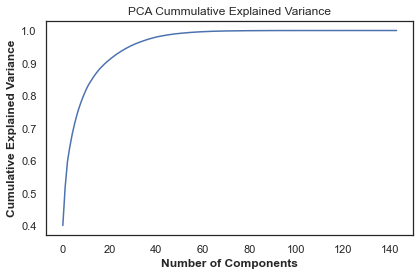

In [106]:
#plot cummulative explained variance
plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.title('PCA Cummulative Explained Variance')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.tight_layout()
plt.show()

# Comparing Feature Selections of Different Models

In [107]:
# add rank to Logistic feature importance three classes
best_logistic['top_logistic_0_2']= range(1,len(best_logistic)+1)


# add rank to Random Forest feature importance three classes
df_fi_rfc = df_fi_rfc.rename(columns = {'Features':'Contextual_features','Importance':'values'})
df_fi_rfc['top_Random_Forest_0_2']= range(1,len(df_fi_rfc)+1)


# add rank to Logistic feature importance two classes
best_logistic_0_1['top_logistic_0_1']= range(1,len(best_logistic_0_1)+1)


# Random Forest feature importance two classes
df_fi_rfc_0_1 = df_fi_rfc_0_1.rename(columns = {'Features':'Contextual_features','Importance':'values'})
df_fi_rfc_0_1['top_Random_Forest_0_1']= range(1,len(df_fi_rfc_0_1)+1)


df_fi_rfc_0_1.head()

,Contextual_features,values,top_Random_Forest_0_1
0,gabor_sc5_filter_12,0.02106,1
1,gabor_sc5_filter_13,0.016681,2
2,gabor_sc5_filter_1,0.016502,3
3,gabor_sc3_variance,0.016486,4
4,lbpm_sc3_max,0.01604,5


In [108]:
#merge best featurees 

best_2 = best_logistic.merge(df_fi_rfc[['Contextual_features','top_Random_Forest_0_2']], on = 'Contextual_features')
best_1 = best_2.merge(best_logistic_0_1[['Contextual_features','top_logistic_0_1']], on = 'Contextual_features')
best = best_1.merge(df_fi_rfc_0_1[['Contextual_features','top_Random_Forest_0_1']], on = 'Contextual_features')

#create rank column
best['overall_rank'] = best['top_logistic_0_2'] + best['top_Random_Forest_0_2'] + best['top_logistic_0_1'] + best['top_Random_Forest_0_1'] 

best.sort_values(by= ['overall_rank']).reset_index(drop=True)
best['rank']= range(1,len(df_fi_rfc_0_1)+1)
#del best['rank']
best.head()

,Contextual_features,feature_number,score,values,top_logistic_0_2,top_Random_Forest_0_2,top_logistic_0_1,top_Random_Forest_0_1,overall_rank,rank
0,ndvi_sc7_variance,29,-10.237441,10.237441,1,98,14,98,211,1
1,ndvi_sc5_variance,27,10.167112,10.167112,2,126,110,117,355,2
2,ndvi_sc7_mean,28,-9.430494,9.430494,3,113,109,58,283,3
3,ndvi_sc3_mean,24,7.181088,7.181088,4,49,7,54,114,4
4,mean_sc3_mean,93,6.157483,6.157483,5,116,126,88,335,5


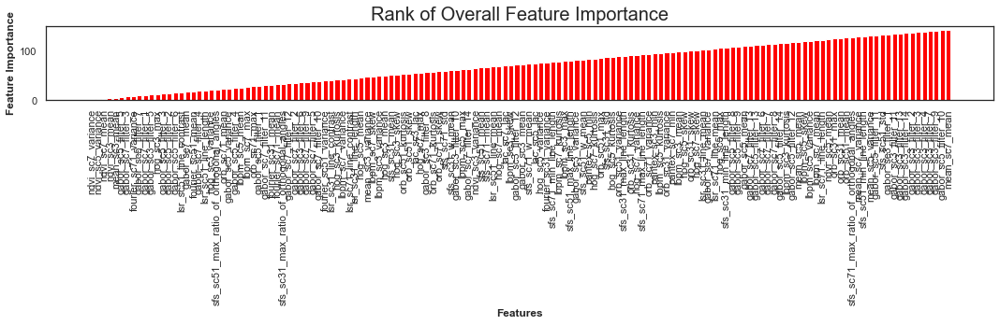

In [109]:
fig = plt.figure(figsize=(15, 5))
plt.bar(best['Contextual_features'], best['rank'], color='red')

# Set x-axis
plt.title('Rank of Overall Feature Importance', fontsize=20)
plt.xlabel('Features')
plt.xticks(rotation=90)

# Set y-axis
plt.ylabel('Feature Importance')

# Save and show the figure
plt.tight_layout()
plt.show()

In [110]:
best['Contextual_features'].tolist()[:10]

['ndvi_sc7_variance',
 'ndvi_sc5_variance',
 'ndvi_sc7_mean',
 'ndvi_sc3_mean',
 'mean_sc3_mean',
 'gabor_sc5_filter_5',
 'gabor_sc7_filter_3',
 'fourier_sc71_variance',
 'gabor_sc5_filter_7',
 'gabor_sc7_filter_1']